In [13]:

import csv

# Specify the path to your CSV file
file_path = '/content/heart_attack_prediction_dataset.csv'

# Initialize an empty list to store the data
data = []

# Open and read the CSV file
with open(file_path, mode='r') as file:
    csv_reader = csv.reader(file)
    headers = next(csv_reader)  # Read the header row
    for row in csv_reader:
        data.append(row)

# Print the headers and the first few rows to verify the data was loaded correctly
print("Headers:", headers)
print("\nFirst 5 rows of data:")
for row in data[:5]:
    print(row)


Headers: ['Patient ID', 'Age', 'Sex', 'Cholesterol', 'Blood Pressure', 'Heart Rate', 'Diabetes', 'Family History', 'Smoking', 'Obesity', 'Alcohol Consumption', 'Exercise Hours Per Week', 'Diet', 'Previous Heart Problems', 'Medication Use', 'Stress Level', 'Sedentary Hours Per Day', 'Income', 'BMI', 'Triglycerides', 'Physical Activity Days Per Week', 'Sleep Hours Per Day', 'Country', 'Continent', 'Hemisphere', 'Heart Attack Risk']

First 5 rows of data:
['BMW7812', '67', 'Male', '208', '158/88', '72', '0', '0', '1', '0', '0', '4.168188835442079', 'Average', '0', '0', '9', '6.6150014529140595', '261404', '31.251232725295402', '286', '0', '6', 'Argentina', 'South America', 'Southern Hemisphere', '0']
['CZE1114', '21', 'Male', '389', '165/93', '98', '1', '1', '1', '1', '1', '1.8132416178634458', 'Unhealthy', '1', '0', '1', '4.963458839757678', '285768', '27.1949733519874', '235', '1', '7', 'Canada', 'North America', 'Northern Hemisphere', '0']
['BNI9906', '21', 'Female', '324', '174/99', '

In [14]:
import pandas as pd
import numpy as np

# Load the data
file_path = '/content/heart_attack_prediction_dataset.csv'
df = pd.read_csv(file_path)

# Function to clean and preprocess the data
def clean_data(df):
    # Convert numerical columns to appropriate data types
    numeric_columns = ['Age', 'Cholesterol', 'Heart Rate', 'Exercise Hours Per Week',
                       'Sedentary Hours Per Day', 'Income', 'BMI', 'Triglycerides',
                       'Physical Activity Days Per Week', 'Sleep Hours Per Day']
    df[numeric_columns] = df[numeric_columns].apply(pd.to_numeric, errors='coerce')

    # Convert binary columns to integers
    binary_columns = ['Diabetes', 'Family History', 'Smoking', 'Obesity',
                      'Alcohol Consumption', 'Previous Heart Problems',
                      'Medication Use', 'Heart Attack Risk']
    df[binary_columns] = df[binary_columns].astype(int)

    # Handle missing values (if any)
    for column in df.columns:
        if df[column].dtype == 'object':
            df[column].fillna(df[column].mode()[0], inplace=True)
        else:
            df[column].fillna(df[column].median(), inplace=True)

    # Clean 'Blood Pressure' column
    df['Systolic BP'] = df['Blood Pressure'].apply(lambda x: int(x.split('/')[0]))
    df['Diastolic BP'] = df['Blood Pressure'].apply(lambda x: int(x.split('/')[1]))
    df.drop('Blood Pressure', axis=1, inplace=True)

    # Convert 'Stress Level' to numeric
    df['Stress Level'] = pd.to_numeric(df['Stress Level'])

    return df

# Clean the data
cleaned_df = clean_data(df)

# Display info about the cleaned dataset
print(cleaned_df.info())

# Check for any remaining missing values
print("\nMissing values after cleaning:")
print(cleaned_df.isnull().sum())

# Display the first few rows of the cleaned dataset
print("\nFirst few rows of cleaned data:")
print(cleaned_df.head())


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8763 entries, 0 to 8762
Data columns (total 27 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   Patient ID                       8763 non-null   object 
 1   Age                              8763 non-null   int64  
 2   Sex                              8763 non-null   object 
 3   Cholesterol                      8763 non-null   int64  
 4   Heart Rate                       8763 non-null   int64  
 5   Diabetes                         8763 non-null   int64  
 6   Family History                   8763 non-null   int64  
 7   Smoking                          8763 non-null   int64  
 8   Obesity                          8763 non-null   int64  
 9   Alcohol Consumption              8763 non-null   int64  
 10  Exercise Hours Per Week          8763 non-null   float64
 11  Diet                             8763 non-null   object 
 12  Previous Heart Probl

In [15]:
import csv

# Assuming cleaned_df is your cleaned DataFrame
output_file = 'cleaned_heart_attack_prediction_dataset.csv'

# Write the cleaned data to a new CSV file
cleaned_df.to_csv(output_file, index=False)

print(f"Cleaned data has been saved to {output_file}")


Cleaned data has been saved to cleaned_heart_attack_prediction_dataset.csv


In [16]:
import pandas as pd

def check_csv_cleanliness(file_path):
    # Read the CSV file
    try:
        data = pd.read_csv(file_path)
    except Exception as e:
        return f"Error reading file: {e}"

    # Initialize a report dictionary
    cleanliness_report = {}

    # Check for missing values
    missing_values = data.isnull().sum().sum()
    cleanliness_report['Missing Values'] = missing_values

    # Check for duplicate rows
    duplicate_rows = data.duplicated().sum()
    cleanliness_report['Duplicate Rows'] = duplicate_rows

    # Check for inconsistent data types
    inconsistent_data_types = {}
    for column in data.columns:
        unique_types = data[column].map(type).nunique()
        if unique_types > 1:
            inconsistent_data_types[column] = unique_types
    cleanliness_report['Inconsistent Data Types'] = inconsistent_data_types

    # Summary
    if missing_values == 0 and duplicate_rows == 0 and not inconsistent_data_types:
        cleanliness_report['Is Clean'] = True
    else:
        cleanliness_report['Is Clean'] = False

    return cleanliness_report

# Example usage
file_path = "cleaned_heart_attack_prediction_dataset.csv"  # Replace with your file path
report = check_csv_cleanliness(file_path)

# Print the cleanliness report
for key, value in report.items():
    print(f"{key}: {value}")


Missing Values: 0
Duplicate Rows: 0
Inconsistent Data Types: {}
Is Clean: True


In [17]:
import sqlite3
import csv

# Connect to SQLite database (or create it if it doesn't exist)
conn = sqlite3.connect('heart_attack_risk.db')
cursor = conn.cursor()

# Create tables for normalized database in 3NF

# Create table for patient information
cursor.execute('''
CREATE TABLE IF NOT EXISTS Patients (
    PatientID TEXT PRIMARY KEY,
    Age INTEGER,
    Sex TEXT,
    Country TEXT,
    Continent TEXT,
    Hemisphere TEXT
)
''')

# Create table for health metrics
cursor.execute('''
CREATE TABLE IF NOT EXISTS HealthMetrics (
    PatientID TEXT,
    Cholesterol INTEGER,
    SystolicBP INTEGER,
    DiastolicBP INTEGER,
    HeartRate INTEGER,
    BMI REAL,
    Triglycerides INTEGER,
    FOREIGN KEY (PatientID) REFERENCES Patients(PatientID)
)
''')

# Create table for medical history
cursor.execute('''
CREATE TABLE IF NOT EXISTS MedicalHistory (
    PatientID TEXT,
    Diabetes INTEGER,
    FamilyHistory INTEGER,
    PreviousHeartProblems INTEGER,
    MedicationUse INTEGER,
    FOREIGN KEY (PatientID) REFERENCES Patients(PatientID)
)
''')

# Create table for lifestyle factors
cursor.execute('''
CREATE TABLE IF NOT EXISTS LifestyleFactors (
    PatientID TEXT,
    Smoking INTEGER,
    Obesity INTEGER,
    AlcoholConsumption INTEGER,
    ExerciseHoursPerWeek REAL,
    Diet TEXT,
    StressLevel INTEGER,
    SedentaryHoursPerDay REAL,
    Income INTEGER,
    PhysicalActivityDaysPerWeek INTEGER,
    SleepHoursPerDay INTEGER,
    FOREIGN KEY (PatientID) REFERENCES Patients(PatientID)
)
''')

# Create table for heart attack risk
cursor.execute('''
CREATE TABLE IF NOT EXISTS HeartAttackRisk (
    PatientID TEXT,
    HeartAttackRisk INTEGER,
    FOREIGN KEY (PatientID) REFERENCES Patients(PatientID)
)
''')

# Load data from CSV file into the normalized tables
with open('cleaned_heart_attack_prediction_dataset.csv', 'r') as file:
    csv_reader = csv.DictReader(file)

    for row in csv_reader:
        # Insert data into Patients table
        cursor.execute('''
        INSERT OR REPLACE INTO Patients (PatientID, Age, Sex, Country, Continent, Hemisphere)
        VALUES (?, ?, ?, ?, ?, ?)
        ''', (row['Patient ID'], row['Age'], row['Sex'], row['Country'], row['Continent'], row['Hemisphere']))


      # Insert data into HealthMetrics table
        cursor.execute('''
        INSERT INTO HealthMetrics (PatientID, Cholesterol, SystolicBP, DiastolicBP, HeartRate, BMI, Triglycerides)
        VALUES (?, ?, ?, ?, ?, ?, ?)
        ''', (row['Patient ID'], row['Cholesterol'], row['Systolic BP'], row['Diastolic BP'],
       row['Heart Rate'], row['BMI'], row['Triglycerides']))


        # Insert data into MedicalHistory table
        cursor.execute('''
        INSERT INTO MedicalHistory (PatientID, Diabetes, FamilyHistory, PreviousHeartProblems, MedicationUse)
        VALUES (?, ?, ?, ?, ?)
        ''', (row['Patient ID'], row['Diabetes'], row['Family History'],
               row['Previous Heart Problems'], row['Medication Use']))

        # Insert data into LifestyleFactors table
        cursor.execute('''
        INSERT INTO LifestyleFactors (PatientID, Smoking, Obesity, AlcoholConsumption, ExerciseHoursPerWeek, Diet,
                                      StressLevel, SedentaryHoursPerDay, Income,
                                      PhysicalActivityDaysPerWeek, SleepHoursPerDay)
        VALUES (?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?)
        ''', (row['Patient ID'], row['Smoking'], row['Obesity'],
               row['Alcohol Consumption'], row['Exercise Hours Per Week'],
               row['Diet'], row['Stress Level'],
               row['Sedentary Hours Per Day'],
               row['Income'],
               row['Physical Activity Days Per Week'],
               row['Sleep Hours Per Day']))

        # Insert data into HeartAttackRisk table
        cursor.execute('''
        INSERT INTO HeartAttackRisk (PatientID, HeartAttackRisk)
        VALUES (?, ?)
        ''', (row['Patient ID'], row['Heart Attack Risk']))

# Commit changes and close connection
conn.commit()
conn.close()

print("Normalized database created and data loaded successfully.")


Normalized database created and data loaded successfully.


In [18]:
# Create Database tables
import sqlite3

# Connect to SQLite database (or create it if it doesn't exist)
conn = sqlite3.connect('heart_attack_risk.db')
cursor = conn.cursor()

# Create table for patient information
cursor.execute('''
CREATE TABLE IF NOT EXISTS Patients (
    PatientID TEXT PRIMARY KEY,
    Age INTEGER,
    Sex TEXT,
    Country TEXT,
    Continent TEXT,
    Hemisphere TEXT
)
''')

# Create table for health metrics
cursor.execute('''
CREATE TABLE IF NOT EXISTS HealthMetrics (
    PatientID TEXT,
    Cholesterol INTEGER,
    SystolicBP INTEGER,
    DiastolicBP INTEGER,
    HeartRate INTEGER,
    BMI REAL,
    Triglycerides INTEGER,
    FOREIGN KEY (PatientID) REFERENCES Patients(PatientID)
)
''')

# Create table for medical history
cursor.execute('''
CREATE TABLE IF NOT EXISTS MedicalHistory (
    PatientID TEXT,
    Diabetes INTEGER,
    FamilyHistory INTEGER,
    PreviousHeartProblems INTEGER,
    MedicationUse INTEGER,
    FOREIGN KEY (PatientID) REFERENCES Patients(PatientID)
)
''')

# Create table for lifestyle factors
cursor.execute('''
CREATE TABLE IF NOT EXISTS LifestyleFactors (
    PatientID TEXT,
    Smoking INTEGER,
    Obesity INTEGER,
    AlcoholConsumption INTEGER,
    ExerciseHoursPerWeek REAL,
    Diet TEXT,
    StressLevel INTEGER,
    SedentaryHoursPerDay REAL,
    Income INTEGER,
    PhysicalActivityDaysPerWeek INTEGER,
    SleepHoursPerDay INTEGER,
    FOREIGN KEY (PatientID) REFERENCES Patients(PatientID)
)
''')

# Create table for heart attack risk
cursor.execute('''
CREATE TABLE IF NOT EXISTS HeartAttackRisk (
    PatientID TEXT,
    HeartAttackRisk INTEGER,
    FOREIGN KEY (PatientID) REFERENCES Patients(PatientID)
)
''')

# Commit changes and close connection
conn.commit()
conn.close()

print("Database tables created successfully.")


Database tables created successfully.


In [19]:
#Data inserted successfully into the database tables.
#import sqlite3
import csv

# Connect to SQLite database
conn = sqlite3.connect('heart_attack_risk.db')
cursor = conn.cursor()

# Load data from CSV file
file_path = 'cleaned_heart_attack_prediction_dataset.csv'

with open(file_path, 'r') as file:
    csv_reader = csv.DictReader(file)

    for row in csv_reader:
        # Insert data into Patients table
        cursor.execute('''
        INSERT OR REPLACE INTO Patients (PatientID, Age, Sex, Country, Continent, Hemisphere)
        VALUES (?, ?, ?, ?, ?, ?)
        ''', (row['Patient ID'], row['Age'], row['Sex'], row['Country'], row['Continent'], row['Hemisphere']))


        # Insert data into HealthMetrics table
        cursor.execute('''
        INSERT INTO HealthMetrics (PatientID, Cholesterol, SystolicBP, DiastolicBP, HeartRate, BMI, Triglycerides)
        VALUES (?, ?, ?, ?, ?, ?, ?)
        ''', (row['Patient ID'], row['Cholesterol'], row['Systolic BP'], row['Diastolic BP'],
               row['Heart Rate'], row['BMI'], row['Triglycerides']))

        # Insert data into MedicalHistory table
        cursor.execute('''
        INSERT INTO MedicalHistory (PatientID, Diabetes, FamilyHistory, PreviousHeartProblems, MedicationUse)
        VALUES (?, ?, ?, ?, ?)
        ''', (row['Patient ID'], row['Diabetes'], row['Family History'],
               row['Previous Heart Problems'], row['Medication Use']))

        # Insert data into LifestyleFactors table
        cursor.execute('''
        INSERT INTO LifestyleFactors (PatientID, Smoking, Obesity, AlcoholConsumption, ExerciseHoursPerWeek, Diet,
                                      StressLevel, SedentaryHoursPerDay, Income,
                                      PhysicalActivityDaysPerWeek, SleepHoursPerDay)
        VALUES (?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?)
        ''', (row['Patient ID'], row['Smoking'], row['Obesity'],
               row['Alcohol Consumption'], row['Exercise Hours Per Week'],
               row['Diet'], row['Stress Level'],
               row['Sedentary Hours Per Day'],
               row['Income'],
               row['Physical Activity Days Per Week'],
               row['Sleep Hours Per Day']))

        # Insert data into HeartAttackRisk table
        cursor.execute('''
        INSERT INTO HeartAttackRisk (PatientID, HeartAttackRisk)
        VALUES (?, ?)
        ''', (row['Patient ID'], row['Heart Attack Risk']))

# Commit changes and close connection
conn.commit()
conn.close()

print("Data inserted successfully into the database tables.")



Data inserted successfully into the database tables.


In [20]:
import sqlite3
import pandas as pd

# Connect to the SQLite database
conn = sqlite3.connect('heart_attack_risk.db')

# List of table names
tables = ['Patients', 'HealthMetrics', 'MedicalHistory', 'LifestyleFactors', 'HeartAttackRisk']

# Function to fetch and display the first 5 rows of a table
def display_table_preview(table_name):
    query = f"SELECT * FROM {table_name} LIMIT 5"
    df = pd.read_sql_query(query, conn)
    print(f"\nFirst 5 rows of {table_name} table:")
    print(df)
    print("\n" + "="*50 + "\n")

# Display preview for each table
for table in tables:
    display_table_preview(table)

# Close the database connection
conn.close()



First 5 rows of Patients table:
  PatientID  Age     Sex    Country      Continent           Hemisphere
0   BMW7812   67    Male  Argentina  South America  Southern Hemisphere
1   CZE1114   21    Male     Canada  North America  Northern Hemisphere
2   BNI9906   21  Female     France         Europe  Northern Hemisphere
3   JLN3497   84    Male     Canada  North America  Northern Hemisphere
4   GFO8847   66    Male   Thailand           Asia  Northern Hemisphere



First 5 rows of HealthMetrics table:
  PatientID  Cholesterol  SystolicBP  DiastolicBP  HeartRate        BMI  \
0   BMW7812          208         158           88         72  31.251233   
1   CZE1114          389         165           93         98  27.194973   
2   BNI9906          324         174           99         72  28.176571   
3   JLN3497          383         163          100         73  36.464704   
4   GFO8847          318          91           88         93  21.809144   

   Triglycerides  
0            286  
1     

In [21]:
import sqlite3
import pandas as pd

# Connect to the SQLite database
conn = sqlite3.connect('heart_attack_risk.db')

# Define the SQL query
query = '''
SELECT *
FROM Patients p
JOIN HealthMetrics hm ON p.PatientID = hm.PatientID
JOIN MedicalHistory mh ON p.PatientID = mh.PatientID
JOIN LifestyleFactors lf ON p.PatientID = lf.PatientID
JOIN HeartAttackRisk hr ON p.PatientID = hr.PatientID
'''

# Execute the query and load the result into a DataFrame
df = pd.read_sql_query(query, conn)

# Close the database connection
conn.close()

# Display the first few rows and basic information about the DataFrame
print(df.head())
print(df.info())


  PatientID  Age   Sex    Country      Continent           Hemisphere  \
0   BMW7812   67  Male  Argentina  South America  Southern Hemisphere   
1   BMW7812   67  Male  Argentina  South America  Southern Hemisphere   
2   BMW7812   67  Male  Argentina  South America  Southern Hemisphere   
3   BMW7812   67  Male  Argentina  South America  Southern Hemisphere   
4   BMW7812   67  Male  Argentina  South America  Southern Hemisphere   

  PatientID  Cholesterol  SystolicBP  DiastolicBP  ...  AlcoholConsumption  \
0   BMW7812          208         158           88  ...                   0   
1   BMW7812          208         158           88  ...                   0   
2   BMW7812          208         158           88  ...                   0   
3   BMW7812          208         158           88  ...                   0   
4   BMW7812          208         158           88  ...                   0   

   ExerciseHoursPerWeek     Diet StressLevel  SedentaryHoursPerDay  Income  \
0             

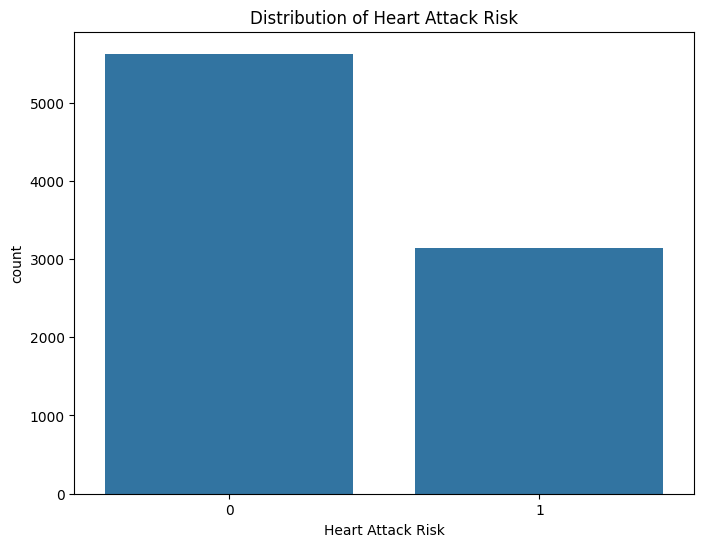

Target Distribution:
0    0.641789
1    0.358211
Name: Heart Attack Risk, dtype: float64


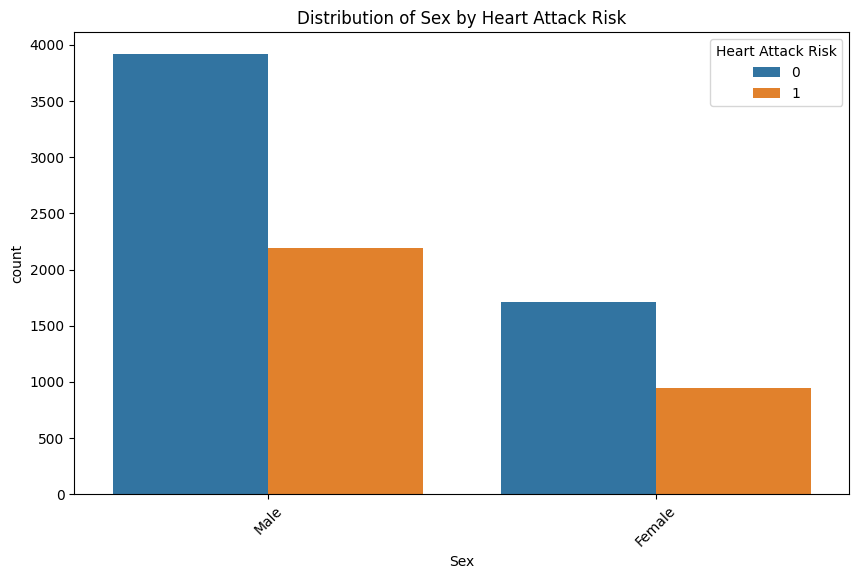

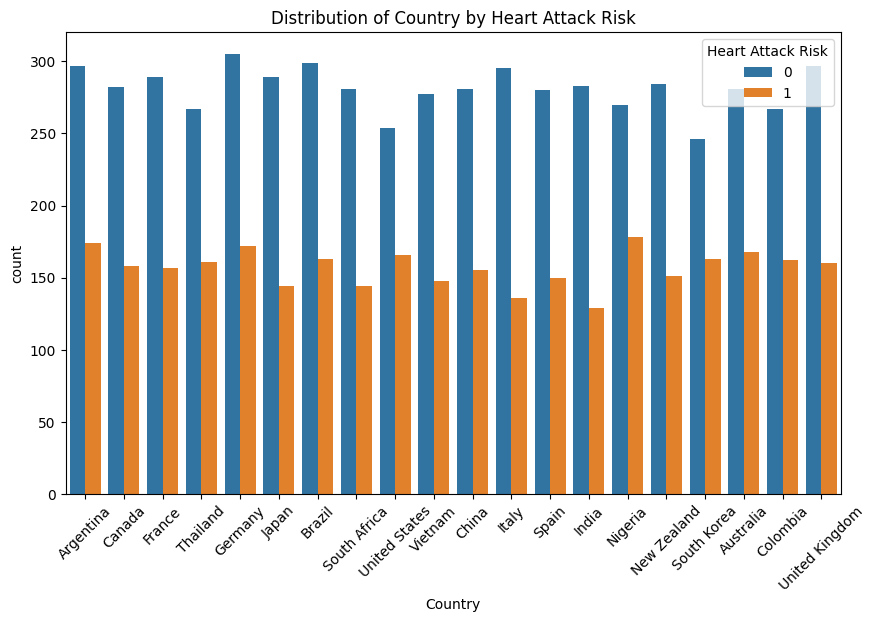

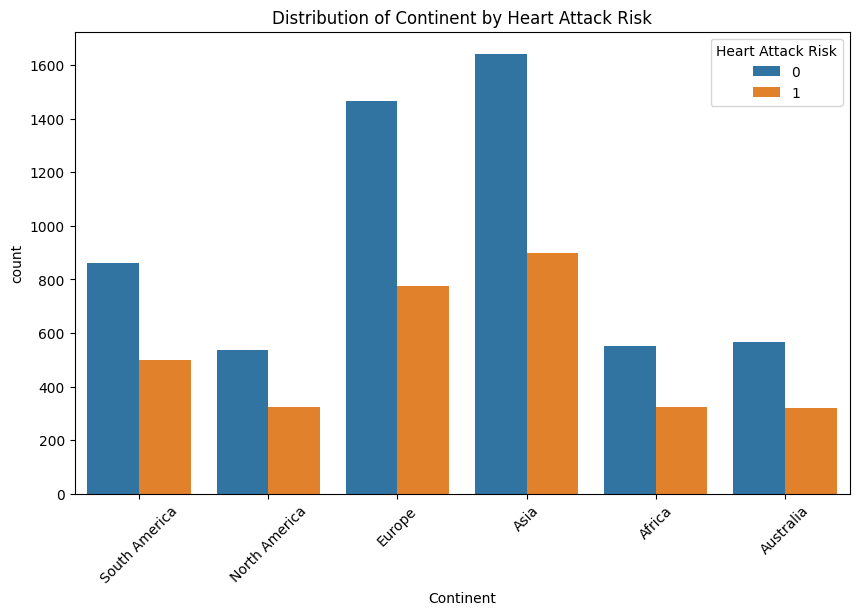

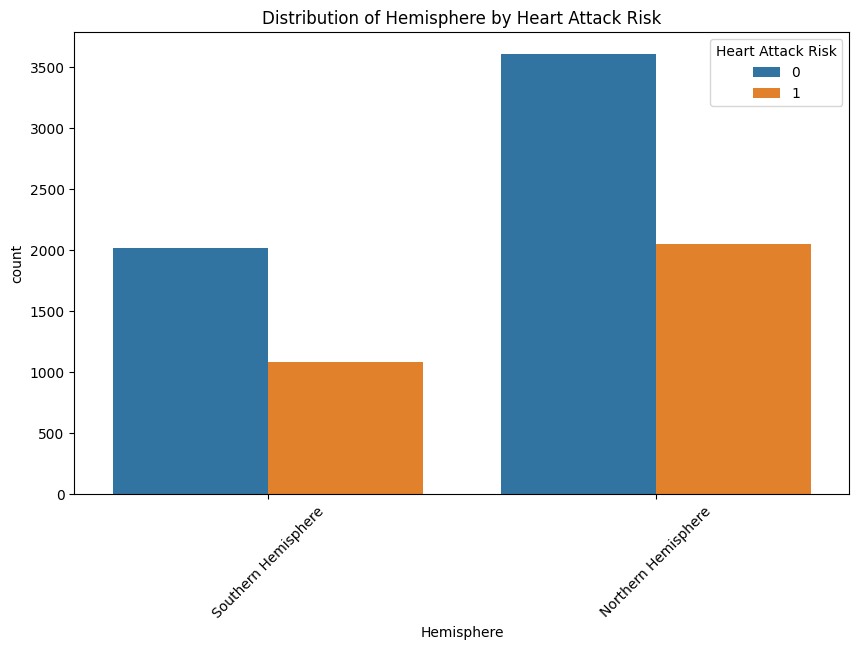

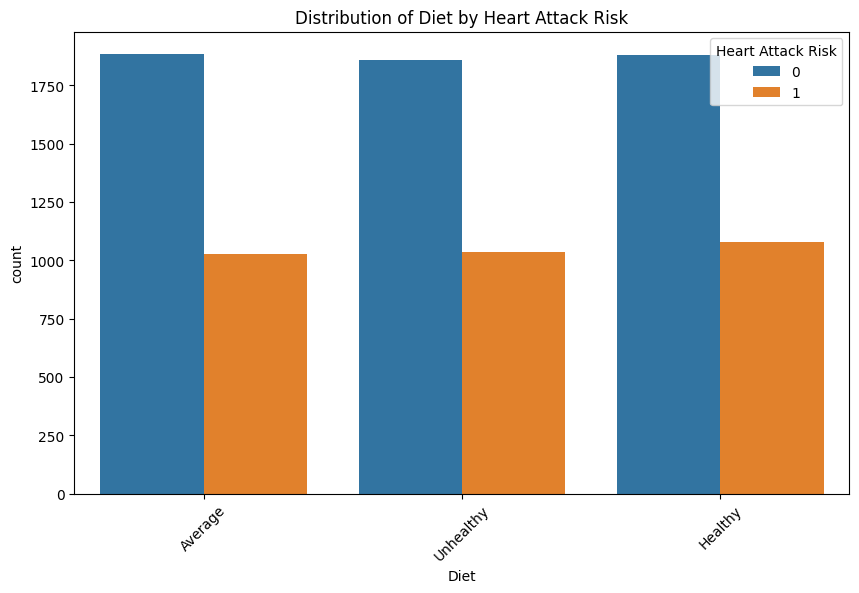

Training set shape: (7010, 26)
Testing set shape: (1753, 26)
Training set target distribution:
0    0.641797
1    0.358203
Name: Heart Attack Risk, dtype: float64
Testing set target distribution:
0    0.641757
1    0.358243
Name: Heart Attack Risk, dtype: float64


In [22]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split

# Load the data from the CSV file
df = pd.read_csv('cleaned_heart_attack_prediction_dataset.csv')

# Explore the distribution of the target variable
plt.figure(figsize=(8, 6))
sns.countplot(x='Heart Attack Risk', data=df)
plt.title('Distribution of Heart Attack Risk')
plt.show()

# Check the balance of the target variable
target_distribution = df['Heart Attack Risk'].value_counts(normalize=True)
print("Target Distribution:")
print(target_distribution)

# Explore other potential stratification attributes
categorical_columns = ['Sex', 'Country', 'Continent', 'Hemisphere', 'Diet']
for col in categorical_columns:
    plt.figure(figsize=(10, 6))
    sns.countplot(x=col, hue='Heart Attack Risk', data=df)
    plt.title(f'Distribution of {col} by Heart Attack Risk')
    plt.xticks(rotation=45)
    plt.show()

# Perform train/test split with stratification
X = df.drop('Heart Attack Risk', axis=1)
y = df['Heart Attack Risk']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, stratify=y, random_state=42)

print(f"Training set shape: {X_train.shape}")
print(f"Testing set shape: {X_test.shape}")
print(f"Training set target distribution:\n{y_train.value_counts(normalize=True)}")
print(f"Testing set target distribution:\n{y_test.value_counts(normalize=True)}")


In [ ]:
#pip install ydata-profiling


In [12]:
#pip install ydata-profiling
#!pip install dagshub
#!pip install mlflow

import sklearn
print(sklearn.__version__)
!pip install scikit-learn==1.5
#pip install scikit-learn

#!pip install xgboost==1.5.2

!pip install --upgrade xgboost
#!pip install pandas==1.4.0



1.5.0


In [23]:
import pandas as pd
from ydata_profiling import ProfileReport

# Generate the profile report
profile = ProfileReport(df, title="Heart Attack Risk Dataset Profiling Report")

# Save the report as an HTML file
profile.to_file("heart_attack_risk_profile_report.html")

# To display the report in a Jupyter notebook, use:
profile.to_notebook_iframe()

print("Profile report has been generated and saved as 'heart_attack_risk_profile_report.html'")



Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

Profile report has been generated and saved as 'heart_attack_risk_profile_report.html'


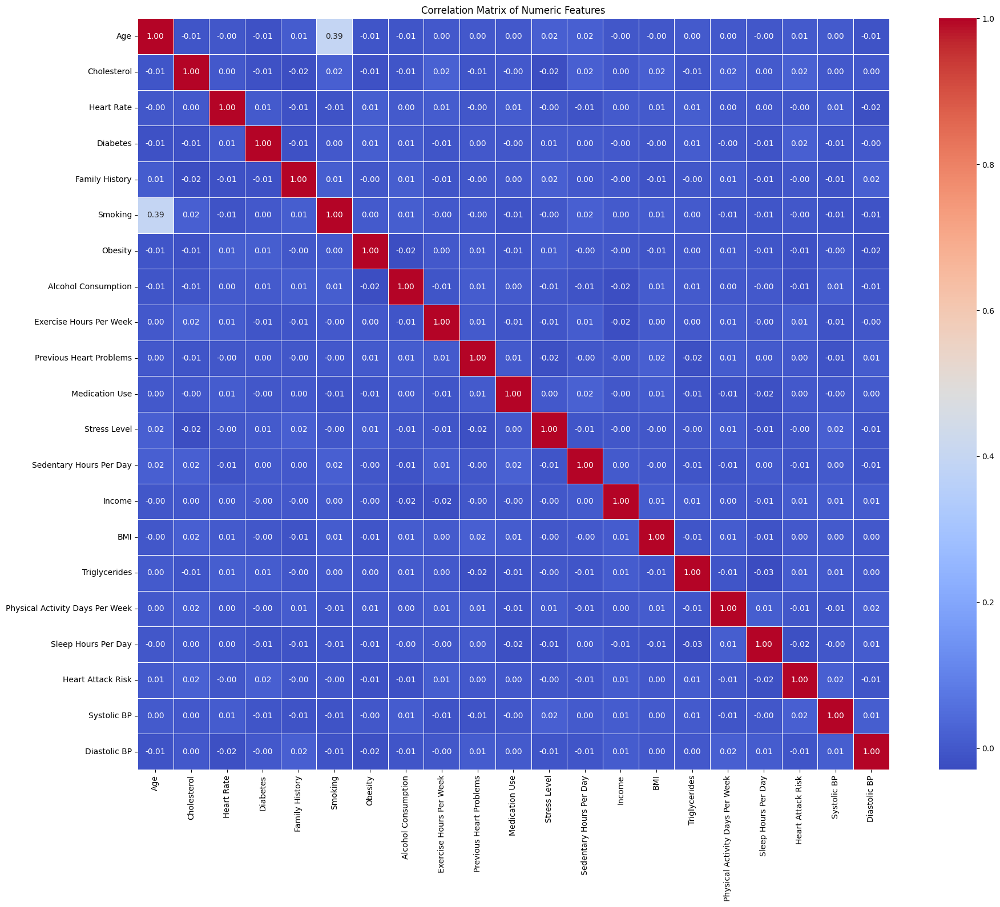

Correlation with Heart Attack Risk:
Heart Attack Risk                  1.000000
Cholesterol                        0.019340
Systolic BP                        0.018585
Diabetes                           0.017225
Exercise Hours Per Week            0.011133
Triglycerides                      0.010471
Income                             0.009628
Age                                0.006403
Medication Use                     0.002234
Previous Heart Problems            0.000274
BMI                                0.000020
Family History                    -0.001652
Smoking                           -0.004051
Stress Level                      -0.004111
Heart Rate                        -0.004251
Physical Activity Days Per Week   -0.005014
Sedentary Hours Per Day           -0.005613
Diastolic BP                      -0.007509
Obesity                           -0.013318
Alcohol Consumption               -0.013778
Sleep Hours Per Day               -0.018528
Name: Heart Attack Risk, dtype: float64


In [24]:
#Explore the data using yprofile and correlation matrix.
import matplotlib.pyplot as plt
import seaborn as sns

# Select numeric columns for correlation
numeric_columns = df.select_dtypes(include=['int64', 'float64']).columns

# Compute the correlation matrix
correlation_matrix = df[numeric_columns].corr()

# Create a heatmap of the correlation matrix
plt.figure(figsize=(20, 16))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', linewidths=0.5, fmt='.2f', square=True)
plt.title('Correlation Matrix of Numeric Features')
plt.tight_layout()
plt.show()

# Display the correlation with the target variable (Heart Attack Risk)
target_correlation = correlation_matrix['Heart Attack Risk'].sort_values(ascending=False)
print("Correlation with Heart Attack Risk:")
print(target_correlation)


               Age  Cholesterol   Heart Rate     Diabetes  Family History  \
count  8763.000000  8763.000000  8763.000000  8763.000000     8763.000000   
mean     53.707977   259.877211    75.021682     0.652288        0.492982   
std      21.249509    80.863276    20.550948     0.476271        0.499979   
min      18.000000   120.000000    40.000000     0.000000        0.000000   
25%      35.000000   192.000000    57.000000     0.000000        0.000000   
50%      54.000000   259.000000    75.000000     1.000000        0.000000   
75%      72.000000   330.000000    93.000000     1.000000        1.000000   
max      90.000000   400.000000   110.000000     1.000000        1.000000   

           Smoking      Obesity  Alcohol Consumption  Exercise Hours Per Week  \
count  8763.000000  8763.000000          8763.000000              8763.000000   
mean      0.896839     0.501426             0.598083                10.014284   
std       0.304186     0.500026             0.490313           

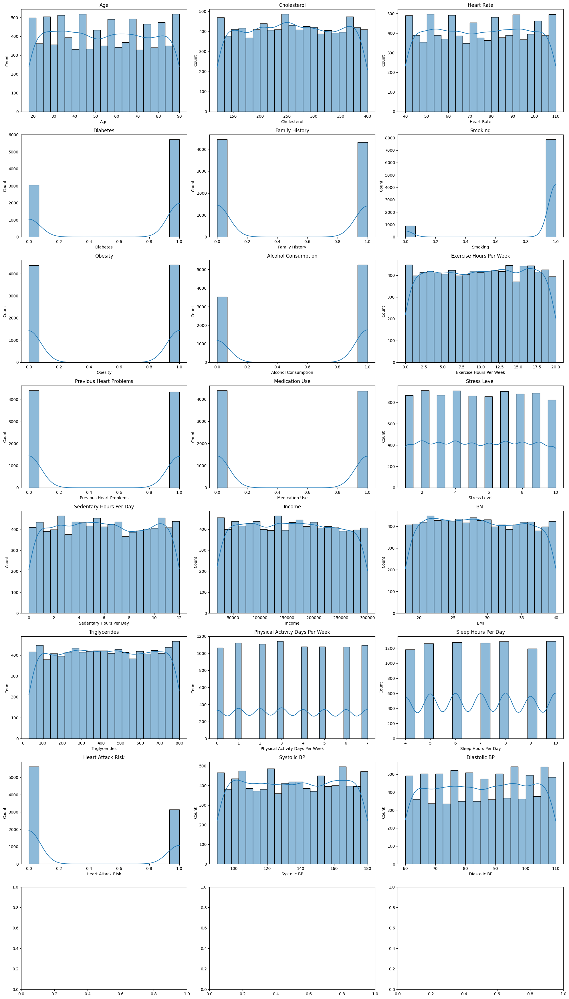

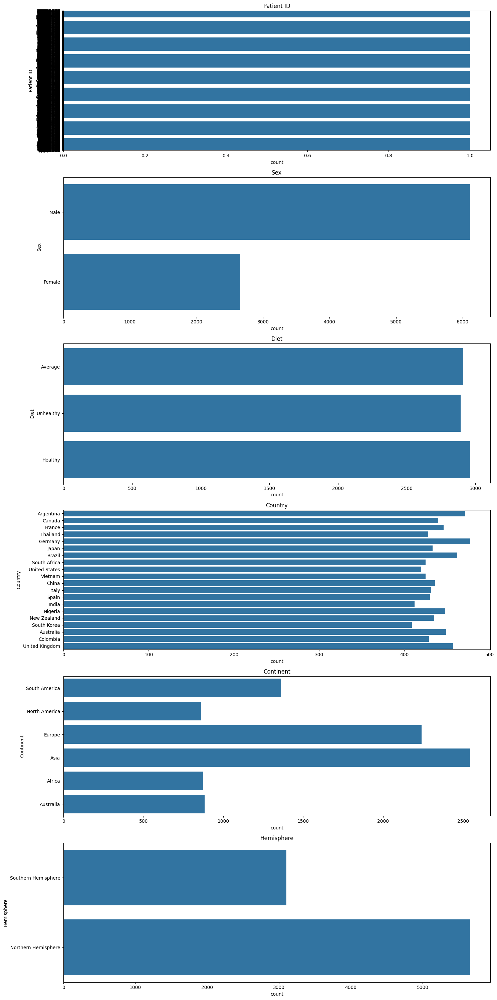


Data Cleanup Tasks:
1. Investigate potentially capped columns: Age, Heart Rate, Diabetes, Family History, Smoking, Obesity, Alcohol Consumption, Previous Heart Problems, Medication Use, Stress Level, Physical Activity Days Per Week, Sleep Hours Per Day, Heart Attack Risk, Systolic BP, Diastolic BP


In [25]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Summary statistics
print(df.describe())

# Check for missing values
missing_values = df.isnull().sum()
print("\nMissing Values:")
print(missing_values[missing_values > 0])

# Check for potential capped values (using 99th percentile)
def check_capped_values(df):
    numeric_cols = df.select_dtypes(include=['int64', 'float64']).columns
    capped_cols = []
    for col in numeric_cols:
        if df[col].max() == df[col].quantile(0.99):
            capped_cols.append(col)
    return capped_cols

capped_columns = check_capped_values(df)
print("\nPotentially Capped Columns:")
print(capped_columns)

# Visualize distributions of numeric features
numeric_cols = df.select_dtypes(include=['int64', 'float64']).columns
fig, axes = plt.subplots(nrows=len(numeric_cols)//3 + 1, ncols=3, figsize=(20, 5*len(numeric_cols)//3))
for i, col in enumerate(numeric_cols):
    sns.histplot(df[col], ax=axes[i//3, i%3], kde=True)
    axes[i//3, i%3].set_title(col)
plt.tight_layout()
plt.show()

# Visualize categorical features
categorical_cols = df.select_dtypes(include=['object']).columns
fig, axes = plt.subplots(nrows=len(categorical_cols), ncols=1, figsize=(15, 5*len(categorical_cols)))
for i, col in enumerate(categorical_cols):
    sns.countplot(y=col, data=df, ax=axes[i])
    axes[i].set_title(col)
plt.tight_layout()
plt.show()

# Create a list of data cleanup tasks
cleanup_tasks = []

if missing_values.sum() > 0:
    cleanup_tasks.append("Handle missing values")

if len(capped_columns) > 0:
    cleanup_tasks.append(f"Investigate potentially capped columns: {', '.join(capped_columns)}")

# Add more tasks based on your observations
# For example:
# cleanup_tasks.append("Normalize skewed distributions")
# cleanup_tasks.append("Encode categorical variables")
# cleanup_tasks.append("Handle outliers")

print("\nData Cleanup Tasks:")
for i, task in enumerate(cleanup_tasks, 1):
    print(f"{i}. {task}")


In [52]:
#pip install dagshub

In [26]:
import dagshub
dagshub.init(repo_owner='aishwarya.salvi28', repo_name='heart_attack_prediction', mlflow=True)

Accessing as aishwarya.salvi28

Initialized MLflow to track repo "aishwarya.salvi28/heart_attack_prediction"

Repository aishwarya.salvi28/heart_attack_prediction initialized!

In [27]:
#!pip install mlflow
import mlflow
mlflow.set_tracking_uri("https://dagshub.com/aishwarya.salvi28/heart_attack_prediction.mlflow")


In [28]:
mlflow.set_experiment("Test1")

2024/12/21 03:08:30 INFO mlflow.tracking.fluent: Experiment with name 'Test1' does not exist. Creating a new experiment.


<Experiment: artifact_location='mlflow-artifacts:/d56f10fb3a50424ca9d1af2db19e9f3c', creation_time=1734750510601, experiment_id='40', last_update_time=1734750510601, lifecycle_stage='active', name='Test1', tags={}>

In [30]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV
from sklearn.preprocessing import StandardScaler, MinMaxScaler, OneHotEncoder, FunctionTransformer
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import f1_score, confusion_matrix
from sklearn.impute import SimpleImputer
import mlflow
import mlflow.sklearn

# Assuming 'df' is your DataFrame and 'Heart Attack Risk' is your target column
X = df.drop('Heart Attack Risk', axis=1)
y = df['Heart Attack Risk']

# Split the data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Define preprocessing steps
numeric_features = X.select_dtypes(include=['int64', 'float64']).columns
categorical_features = X.select_dtypes(include=['object']).columns

numeric_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='median')),
    ('scaler', 'passthrough')  # Will be set during hyperparameter tuning
])

categorical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='constant', fill_value='missing')),
    ('onehot', OneHotEncoder(handle_unknown='ignore'))
])

preprocessor = ColumnTransformer(
    transformers=[
        ('num', numeric_transformer, numeric_features),
        ('cat', categorical_transformer, categorical_features)
    ])

# Create the full pipeline
pipeline = Pipeline([
    ('preprocessor', preprocessor),
    ('classifier', LogisticRegression())
])

# Define hyperparameters for tuning
param_grid = {
    'preprocessor__num__scaler': [StandardScaler(), MinMaxScaler(), FunctionTransformer(np.log1p, validate=True)],
    'classifier__C': [0.1, 1, 10],
    'classifier__penalty': ['l1', 'l2'],
    'classifier__solver': ['liblinear', 'saga']
}

# Set up MLflow experiment
#mlflow.set_experiment("Heart Attack Risk Prediction - Experiment 1")

# Perform GridSearchCV with cross-validation
grid_search = GridSearchCV(pipeline, param_grid, cv=10, scoring='f1', n_jobs=-1)

with mlflow.start_run(run_name="Logistic Regression"):
    grid_search.fit(X_train, y_train)

    # Log best parameters
    mlflow.log_params(grid_search.best_params_)

    # Get cross-validation results
    cv_results = cross_val_score(grid_search.best_estimator_, X_train, y_train, cv=10, scoring='f1')
    mlflow.log_metric("mean_cv_f1", np.mean(cv_results))
    mlflow.log_metric("std_cv_f1", np.std(cv_results))

    # Train on whole training data
    best_model = grid_search.best_estimator_
    best_model.fit(X_train, y_train)
    train_pred = best_model.predict(X_train)
    train_f1 = f1_score(y_train, train_pred)
    mlflow.log_metric("train_f1", train_f1)

    # Evaluate on test data
    test_pred = best_model.predict(X_test)
    test_f1 = f1_score(y_test, test_pred)
    mlflow.log_metric("test_f1", test_f1)

    # Log confusion matrix
    tn, fp, fn, tp = confusion_matrix(y_test, test_pred).ravel()
    mlflow.log_metric("true_negatives", tn)
    mlflow.log_metric("false_positives", fp)
    mlflow.log_metric("false_negatives", fn)
    mlflow.log_metric("true_positives", tp)

    # Log the model
    mlflow.sklearn.log_model(best_model, "model")

    print(f"Best parameters: {grid_search.best_params_}")
    print(f"Mean CV F1-score: {np.mean(cv_results):.4f} (+/- {np.std(cv_results):.4f})")
    print(f"Train F1-score: {train_f1:.4f}")
    print(f"Test F1-score: {test_f1:.4f}")
    print(f"Confusion Matrix: TN={tn}, FP={fp}, FN={fn}, TP={tp}")


2024/12/21 03:24:38 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.


Best parameters: {'classifier__C': 0.1, 'classifier__penalty': 'l1', 'classifier__solver': 'liblinear', 'preprocessor__num__scaler': StandardScaler()}
Mean CV F1-score: 0.0000 (+/- 0.0000)
Train F1-score: 0.0000
Test F1-score: 0.0000
Confusion Matrix: TN=1125, FP=0, FN=628, TP=0
🏃 View run Logistic Regression at: https://dagshub.com/aishwarya.salvi28/heart_attack_prediction.mlflow/#/experiments/40/runs/9a794f83c9004ffe86ad062c57992cd6
🧪 View experiment at: https://dagshub.com/aishwarya.salvi28/heart_attack_prediction.mlflow/#/experiments/40


In [31]:

mlflow.set_experiment("Test2")

2024/12/21 03:26:03 INFO mlflow.tracking.fluent: Experiment with name 'Test2' does not exist. Creating a new experiment.


<Experiment: artifact_location='mlflow-artifacts:/03dab947bf31448a88ea721ec4d52263', creation_time=1734751563089, experiment_id='41', last_update_time=1734751563089, lifecycle_stage='active', name='Test2', tags={}>

In [32]:
import sklearn
print(sklearn.__version__)
#!pip install scikit-learn==1.5
#pip install scikit-learn

1.5.0


In [9]:
#!pip install xgboost==1.5.2


  Using cached xgboost-1.5.2-py3-none-manylinux2014_x86_64.whl.metadata (1.8 kB)
Using cached xgboost-1.5.2-py3-none-manylinux2014_x86_64.whl (173.6 MB)
  Attempting uninstall: xgboost
    Found existing installation: xgboost 2.1.3
    Uninstalling xgboost-2.1.3:
      Successfully uninstalled xgboost-2.1.3


In [33]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.linear_model import LogisticRegression, RidgeClassifier
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
from sklearn.metrics import f1_score, confusion_matrix
from sklearn.impute import SimpleImputer
import mlflow
import mlflow.sklearn

# Assuming 'df' is your DataFrame and 'Heart Attack Risk' is your target column

X = df.drop('Heart Attack Risk', axis=1)
y = df['Heart Attack Risk']

# Split the data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Define preprocessing steps
numeric_features = X.select_dtypes(include=['int64', 'float64']).columns
categorical_features = X.select_dtypes(include=['object']).columns

numeric_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='median')),
    ('scaler', StandardScaler())
])

categorical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='constant', fill_value='missing')),
    ('onehot', OneHotEncoder(handle_unknown='ignore'))
])

preprocessor = ColumnTransformer(
    transformers=[
        ('num', numeric_transformer, numeric_features),
        ('cat', categorical_transformer, categorical_features)
    ])

# Define classifiers
classifiers = {
    'LogisticRegression': LogisticRegression(random_state=42),
    'RidgeClassifier': RidgeClassifier(random_state=42),
    'RandomForestClassifier': RandomForestClassifier(random_state=42),
    'XGBClassifier': XGBClassifier(random_state=42)
}

# Set up MLflow experiment
#mlflow.set_experiment("Exp 2")

for clf_name, classifier in classifiers.items():
    with mlflow.start_run(run_name=clf_name):
        # Create pipeline
        pipeline = Pipeline([
            ('preprocessor', preprocessor),
            ('classifier', classifier)
        ])

        # Fit the pipeline
        pipeline.fit(X_train, y_train)

        # Get cross-validation results
        cv_results = cross_val_score(pipeline, X_train, y_train, cv=10, scoring='f1')
        mlflow.log_metric("mean_cv_f1", np.mean(cv_results))
        mlflow.log_metric("std_cv_f1", np.std(cv_results))

        # Train on whole training data
        pipeline.fit(X_train, y_train)
        train_pred = pipeline.predict(X_train)
        train_f1 = f1_score(y_train, train_pred)
        mlflow.log_metric("train_f1", train_f1)

        # Evaluate on test data
        test_pred = pipeline.predict(X_test)
        test_f1 = f1_score(y_test, test_pred)
        mlflow.log_metric("test_f1", test_f1)

        # Log confusion matrix
        tn, fp, fn, tp = confusion_matrix(y_test, test_pred).ravel()
        mlflow.log_metric("true_negatives", tn)
        mlflow.log_metric("false_positives", fp)
        mlflow.log_metric("false_negatives", fn)
        mlflow.log_metric("true_positives", tp)

        # Log the model
        mlflow.sklearn.log_model(pipeline, "model")

        print(f"Classifier: {clf_name}")
        print(f"Mean CV F1-score: {np.mean(cv_results):.4f} (+/- {np.std(cv_results):.4f})")
        print(f"Train F1-score: {train_f1:.4f}")
        print(f"Test F1-score: {test_f1:.4f}")
        print(f"Confusion Matrix: TN={tn}, FP={fp}, FN={fn}, TP={tp}")
        print("=" * 50)


2024/12/21 03:26:32 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.


Classifier: LogisticRegression
Mean CV F1-score: 0.0000 (+/- 0.0000)
Train F1-score: 0.4745
Test F1-score: 0.0063
Confusion Matrix: TN=1125, FP=0, FN=626, TP=2
🏃 View run LogisticRegression at: https://dagshub.com/aishwarya.salvi28/heart_attack_prediction.mlflow/#/experiments/41/runs/2060c47377a64816be426733eda97e4e
🧪 View experiment at: https://dagshub.com/aishwarya.salvi28/heart_attack_prediction.mlflow/#/experiments/41


2024/12/21 03:26:46 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.


Classifier: RidgeClassifier
Mean CV F1-score: 0.0000 (+/- 0.0000)
Train F1-score: 1.0000
Test F1-score: 0.0063
Confusion Matrix: TN=1125, FP=0, FN=626, TP=2
🏃 View run RidgeClassifier at: https://dagshub.com/aishwarya.salvi28/heart_attack_prediction.mlflow/#/experiments/41/runs/253a4d2e557f499ab26d2368d7ef5de2
🧪 View experiment at: https://dagshub.com/aishwarya.salvi28/heart_attack_prediction.mlflow/#/experiments/41


2024/12/21 03:28:53 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.


Classifier: RandomForestClassifier
Mean CV F1-score: 0.0055 (+/- 0.0061)
Train F1-score: 1.0000
Test F1-score: 0.0063
Confusion Matrix: TN=1123, FP=2, FN=626, TP=2
🏃 View run RandomForestClassifier at: https://dagshub.com/aishwarya.salvi28/heart_attack_prediction.mlflow/#/experiments/41/runs/f60af033e3c2436db209c11a09cd6dd5
🧪 View experiment at: https://dagshub.com/aishwarya.salvi28/heart_attack_prediction.mlflow/#/experiments/41


2024/12/21 03:29:32 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.


Classifier: XGBClassifier
Mean CV F1-score: 0.2577 (+/- 0.0103)
Train F1-score: 0.9836
Test F1-score: 0.2589
Confusion Matrix: TN=899, FP=226, FN=501, TP=127
🏃 View run XGBClassifier at: https://dagshub.com/aishwarya.salvi28/heart_attack_prediction.mlflow/#/experiments/41/runs/64a545fe8a5a4be7bcfbc30448906db9
🧪 View experiment at: https://dagshub.com/aishwarya.salvi28/heart_attack_prediction.mlflow/#/experiments/41


In [34]:
mlflow.set_experiment("Test3")

2024/12/21 03:35:00 INFO mlflow.tracking.fluent: Experiment with name 'Test3' does not exist. Creating a new experiment.


<Experiment: artifact_location='mlflow-artifacts:/c0f106a1f52740c5b6136d0c3f1bb614', creation_time=1734752100463, experiment_id='42', last_update_time=1734752100463, lifecycle_stage='active', name='Test3', tags={}>

In [35]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split, cross_val_score, StratifiedKFold
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.linear_model import LogisticRegression, RidgeClassifier
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
from sklearn.metrics import f1_score, confusion_matrix
from sklearn.impute import SimpleImputer
import mlflow
import mlflow.sklearn

# Assuming 'df' is your DataFrame and 'Heart Attack Risk' is your target column
X = df.drop('Heart Attack Risk', axis=1)
y = df['Heart Attack Risk']

# Feature Engineering
X['Age_squared'] = X['Age'] ** 2
X['BMI_squared'] = X['BMI'] ** 2
X['Cholesterol_to_BMI_ratio'] = X['Cholesterol'] / X['BMI']
X['Exercise_to_Sedentary_ratio'] = X['Exercise Hours Per Week'] / X['Sedentary Hours Per Day']
X['Age_Cholesterol_interaction'] = X['Age'] * X['Cholesterol']

# Split the data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

# Define preprocessing steps
numeric_features = X.select_dtypes(include=['int64', 'float64']).columns
categorical_features = X.select_dtypes(include=['object']).columns

numeric_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='median')),
    ('scaler', StandardScaler())
])

categorical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='constant', fill_value='missing')),
    ('onehot', OneHotEncoder(handle_unknown='ignore'))
])

preprocessor = ColumnTransformer(
    transformers=[
        ('num', numeric_transformer, numeric_features),
        ('cat', categorical_transformer, categorical_features)
    ])

# Define classifiers
classifiers = {
    'LogisticRegression': LogisticRegression(random_state=42),
    'RidgeClassifier': RidgeClassifier(random_state=42),
    'RandomForestClassifier': RandomForestClassifier(random_state=42),
    'XGBClassifier': XGBClassifier(random_state=42)
}

# Function to log metrics
def log_metrics(y_true, y_pred):
    f1 = f1_score(y_true, y_pred)
    tn, fp, fn, tp = confusion_matrix(y_true, y_pred).ravel()
    return {"F1-Score": f1, "TP": tp, "TN": tn, "FP": fp, "FN": fn}

# Set up MLflow experiment
#mlflow.set_experiment("Heart Attack Risk Prediction - Experiment 3")

for clf_name, classifier in classifiers.items():
    with mlflow.start_run(run_name=clf_name):
        # Create pipeline
        pipeline = Pipeline([
            ('preprocessor', preprocessor),
            ('classifier', classifier)
        ])

        # Cross-Validation
        kfold = StratifiedKFold(n_splits=3, shuffle=True, random_state=42)
        cv_scores = cross_val_score(pipeline, X_train, y_train, cv=kfold, scoring='f1')

        # Log cross-validation results
        mlflow.log_metric("mean_cv_f1", np.mean(cv_scores))
        mlflow.log_metric("std_cv_f1", np.std(cv_scores))

        # Fit the pipeline
        pipeline.fit(X_train, y_train)

        # Evaluate on test data
        test_pred = pipeline.predict(X_test)
        test_metrics = log_metrics(y_test, test_pred)

        # Log test metrics
        for key, value in test_metrics.items():
            mlflow.log_metric(key, value)

        # Log the model
        mlflow.sklearn.log_model(pipeline, "model")

        print(f"Classifier: {clf_name}")
        print(f"Mean CV F1-score: {np.mean(cv_scores):.4f} (+/- {np.std(cv_scores):.4f})")
        print(f"Test F1-score: {test_metrics['F1-Score']:.4f}")
        print(f"Confusion Matrix: TN={test_metrics['TN']}, FP={test_metrics['FP']}, FN={test_metrics['FN']}, TP={test_metrics['TP']}")
        print("=" * 50)


2024/12/21 03:35:19 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.


Classifier: LogisticRegression
Mean CV F1-score: 0.0047 (+/- 0.0034)
Test F1-score: 0.0032
Confusion Matrix: TN=1125, FP=0, FN=627, TP=1
🏃 View run LogisticRegression at: https://dagshub.com/aishwarya.salvi28/heart_attack_prediction.mlflow/#/experiments/42/runs/b1c03e36b8924c3a80d651994216f194
🧪 View experiment at: https://dagshub.com/aishwarya.salvi28/heart_attack_prediction.mlflow/#/experiments/42


2024/12/21 03:35:31 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.


Classifier: RidgeClassifier
Mean CV F1-score: 0.0040 (+/- 0.0040)
Test F1-score: 0.0032
Confusion Matrix: TN=1125, FP=0, FN=627, TP=1
🏃 View run RidgeClassifier at: https://dagshub.com/aishwarya.salvi28/heart_attack_prediction.mlflow/#/experiments/42/runs/4fc4e43370124724b28fe9581b6609a9
🧪 View experiment at: https://dagshub.com/aishwarya.salvi28/heart_attack_prediction.mlflow/#/experiments/42


2024/12/21 03:36:08 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.


Classifier: RandomForestClassifier
Mean CV F1-score: 0.0102 (+/- 0.0022)
Test F1-score: 0.0000
Confusion Matrix: TN=1119, FP=6, FN=628, TP=0
🏃 View run RandomForestClassifier at: https://dagshub.com/aishwarya.salvi28/heart_attack_prediction.mlflow/#/experiments/42/runs/63006b621adf4d6883668aca88a459be
🧪 View experiment at: https://dagshub.com/aishwarya.salvi28/heart_attack_prediction.mlflow/#/experiments/42


2024/12/21 03:36:24 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.


Classifier: XGBClassifier
Mean CV F1-score: 0.2619 (+/- 0.0160)
Test F1-score: 0.2787
Confusion Matrix: TN=913, FP=212, FN=492, TP=136
🏃 View run XGBClassifier at: https://dagshub.com/aishwarya.salvi28/heart_attack_prediction.mlflow/#/experiments/42/runs/6035472421e84f10ab873515d4fa37ec
🧪 View experiment at: https://dagshub.com/aishwarya.salvi28/heart_attack_prediction.mlflow/#/experiments/42


In [36]:
mlflow.set_experiment("Test4")

2024/12/21 04:08:18 INFO mlflow.tracking.fluent: Experiment with name 'Test4' does not exist. Creating a new experiment.


<Experiment: artifact_location='mlflow-artifacts:/ca2aaf653a27492995ea514dfce78541', creation_time=1734754098342, experiment_id='43', last_update_time=1734754098342, lifecycle_stage='active', name='Test4', tags={}>

In [24]:
#!pip install --upgrade xgboost
#!pip install pandas==1.4.0



In [23]:
#!pip install pandas==1.4.0


In [37]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split, cross_val_score, StratifiedKFold
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import f1_score, confusion_matrix
from sklearn.feature_selection import VarianceThreshold
from sklearn.pipeline import Pipeline
import mlflow
import mlflow.sklearn
import time

# Assuming 'df' is your DataFrame and 'Heart Attack Risk' is your target column
X = df.drop('Heart Attack Risk', axis=1)
y = df['Heart Attack Risk']

# Feature engineering
X['Age_squared'] = X['Age'] ** 2
X['Age_to_exercise_ratio'] = X['Age'] / X['Exercise Hours Per Week'].replace(0, 1e-6)
X['Exercise_hours_squared'] = X['Exercise Hours Per Week'] ** 2

# Drop non-numeric columns for feature selection
X_numeric = X.select_dtypes(include=['number'])

# Feature Selection Methods
def correlation_threshold(X, y=None, threshold=0.9):
    corr_matrix = X.corr()
    upper_triangle = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(bool))
    to_drop = [column for column in upper_triangle.columns if any(upper_triangle[column].abs() > threshold)]
    return X.drop(columns=to_drop)

def feature_importance(X, y, threshold=0.01):
    rf = RandomForestClassifier(n_estimators=100, random_state=42)
    rf.fit(X, y)
    feature_importance = pd.Series(rf.feature_importances_, index=X.columns)
    important_features = feature_importance[feature_importance > threshold]
    return X[important_features.index]

def variance_threshold(X, y=None, threshold=0.01):
    selector = VarianceThreshold(threshold=threshold)
    return X.loc[:, selector.fit(X).get_support()]

X_train, X_test, y_train, y_test = train_test_split(X_numeric, y, test_size=0.2, random_state=42)

mlflow.set_experiment("Heart Attack Risk Prediction - Experiment 4")

for feature_selection_method, selector in {
    "Correlation_Threshold": correlation_threshold,
    "Feature_Importance": feature_importance,
    "Variance_Threshold": variance_threshold,
}.items():
    run_name = f"EX 4 - {feature_selection_method} - {int(time.time())}"
    with mlflow.start_run(run_name=run_name):
        mlflow.log_param("Feature Selection Method", feature_selection_method)

        # Apply the feature selection method
        if feature_selection_method == "Feature_Importance":
            X_train_selected = selector(X_train, y_train)
        else:
            X_train_selected = selector(X_train)
        X_test_selected = X_test[X_train_selected.columns]

        # Log the selected features
        mlflow.log_param("Selected Features", X_train_selected.columns.tolist())

        # Define models for the pipeline
        models = {
            "RandomForestClassifier": RandomForestClassifier(n_estimators=100, random_state=42)
        }

        for model_name, model in models.items():
            with mlflow.start_run(nested=True):
                mlflow.log_param("Model", model_name)

                pipeline = Pipeline([("classifier", model)])

                try:
                    # Cross-Validation
                    kfold = StratifiedKFold(n_splits=3, shuffle=True, random_state=42)
                    scores = cross_val_score(pipeline, X_train_selected, y_train, cv=kfold, scoring="f1")
                    mean_score = scores.mean()
                    std_score = scores.std()

                    # Train the model on the full training data
                    pipeline.fit(X_train_selected, y_train)
                    y_pred = pipeline.predict(X_test_selected)
                    f1 = f1_score(y_test, y_pred)
                    tn, fp, fn, tp = confusion_matrix(y_test, y_pred).ravel()

                    # Log metrics to MLFlow
                    mlflow.log_metric("Mean_CV_F1", mean_score)
                    mlflow.log_metric("STD_CV_F1", std_score)
                    mlflow.log_metric("F1-Score", f1)
                    mlflow.log_metric("TP", tp)
                    mlflow.log_metric("TN", tn)
                    mlflow.log_metric("FP", fp)
                    mlflow.log_metric("FN", fn)

                    mlflow.sklearn.log_model(pipeline, f"{model_name}_pipeline")

                    print(f"Feature Selection Method: {feature_selection_method}, Model: {model_name}")
                    print(f"Mean CV F1-Score: {mean_score:.4f}, STD: {std_score:.4f}")

                except Exception as e:
                    print(f"An error occurred with {feature_selection_method} and {model_name}: {str(e)}")
                    mlflow.log_param("Error", str(e))

        # Log library versions
        mlflow.log_param("pandas_version", pd.__version__)
        mlflow.log_param("sklearn_version", sklearn.__version__)

print("Experiment completed.")


2024/12/21 04:09:03 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.


Feature Selection Method: Correlation_Threshold, Model: RandomForestClassifier
Mean CV F1-Score: 0.0571, STD: 0.0030
🏃 View run merciful-cat-703 at: https://dagshub.com/aishwarya.salvi28/heart_attack_prediction.mlflow/#/experiments/14/runs/715d9ff04da24362ba0bdfef78d97a8e
🧪 View experiment at: https://dagshub.com/aishwarya.salvi28/heart_attack_prediction.mlflow/#/experiments/14
🏃 View run EX 4 - Correlation_Threshold - 1734754105 at: https://dagshub.com/aishwarya.salvi28/heart_attack_prediction.mlflow/#/experiments/14/runs/d149023ce3864c0bab5db76bef5d0f22
🧪 View experiment at: https://dagshub.com/aishwarya.salvi28/heart_attack_prediction.mlflow/#/experiments/14


2024/12/21 04:09:37 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.


Feature Selection Method: Feature_Importance, Model: RandomForestClassifier
Mean CV F1-Score: 0.0708, STD: 0.0054
🏃 View run bold-ant-280 at: https://dagshub.com/aishwarya.salvi28/heart_attack_prediction.mlflow/#/experiments/14/runs/0689ea22c16443478bfbf71a4fb81429
🧪 View experiment at: https://dagshub.com/aishwarya.salvi28/heart_attack_prediction.mlflow/#/experiments/14
🏃 View run EX 4 - Feature_Importance - 1734754146 at: https://dagshub.com/aishwarya.salvi28/heart_attack_prediction.mlflow/#/experiments/14/runs/c659b9d6debd4c4ebeec59c773d37363
🧪 View experiment at: https://dagshub.com/aishwarya.salvi28/heart_attack_prediction.mlflow/#/experiments/14


2024/12/21 04:09:57 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.


Feature Selection Method: Variance_Threshold, Model: RandomForestClassifier
Mean CV F1-Score: 0.0681, STD: 0.0032
🏃 View run adventurous-bird-95 at: https://dagshub.com/aishwarya.salvi28/heart_attack_prediction.mlflow/#/experiments/14/runs/bd343a64180f4661a54706337c4336ec
🧪 View experiment at: https://dagshub.com/aishwarya.salvi28/heart_attack_prediction.mlflow/#/experiments/14
🏃 View run EX 4 - Variance_Threshold - 1734754180 at: https://dagshub.com/aishwarya.salvi28/heart_attack_prediction.mlflow/#/experiments/14/runs/8fd57444a2b2499391860a7581b5d3e4
🧪 View experiment at: https://dagshub.com/aishwarya.salvi28/heart_attack_prediction.mlflow/#/experiments/14
Experiment completed.


In [38]:
mlflow.set_experiment("Test5")

2024/12/21 04:10:53 INFO mlflow.tracking.fluent: Experiment with name 'Test5' does not exist. Creating a new experiment.


<Experiment: artifact_location='mlflow-artifacts:/4006e4e211ac44779c2052f1bfbd1a96', creation_time=1734754253507, experiment_id='44', last_update_time=1734754253507, lifecycle_stage='active', name='Test5', tags={}>

In [39]:
import mlflow
import mlflow.sklearn
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.pipeline import Pipeline
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import StratifiedKFold, cross_val_score, train_test_split
from sklearn.metrics import f1_score, confusion_matrix
import numpy as np
import time

# Apply PCA for dimensionality reduction
def pca_experiment(X_train, X_test, y_train, y_test, n_components=None):
    # Initialize PCA
    pca = PCA(n_components=n_components)

    # Fit PCA on training data and transform both train and test data
    X_train_pca = pca.fit_transform(X_train)
    X_test_pca = pca.transform(X_test)

    # Create a scree plot (explained variance ratio)
    plt.figure(figsize=(8, 6))
    plt.plot(range(1, len(pca.explained_variance_ratio_) + 1), pca.explained_variance_ratio_, marker='o', linestyle='--')
    plt.title("Scree Plot - Explained Variance Ratio by Principal Components")
    plt.xlabel("Principal Components")
    plt.ylabel("Explained Variance Ratio")
    plt.grid(True)

    # Save the plot as a file
    plot_filename = f"scree_plot_{n_components}.png"
    plt.savefig(plot_filename)
    plt.close()

    # Log PCA components and explained variance to MLFlow
    mlflow.log_param("PCA_n_components", n_components)
    mlflow.log_param("Explained_Variance_Ratio", pca.explained_variance_ratio_.tolist())
    mlflow.log_artifact(plot_filename)

    # Apply classification model on the reduced features
    model = RandomForestClassifier(n_estimators=100, random_state=42)

    # Define a pipeline for the model
    pipeline = Pipeline([
        ("classifier", model)
    ])

    # Cross-Validation
    kfold = StratifiedKFold(n_splits=3, shuffle=True, random_state=42)
    scores = cross_val_score(pipeline, X_train_pca, y_train, cv=kfold, scoring="f1")
    mean_score = scores.mean()
    std_score = scores.std()

    # Train the model on the full training data
    pipeline.fit(X_train_pca, y_train)
    y_pred = pipeline.predict(X_test_pca)
    f1 = f1_score(y_test, y_pred)
    tn, fp, fn, tp = confusion_matrix(y_test, y_pred).ravel()

    # Log metrics to MLFlow
    mlflow.log_metric("Mean_CV_F1", mean_score)
    mlflow.log_metric("STD_CV_F1", std_score)
    mlflow.log_metric("F1-Score", f1)
    mlflow.log_metric("TP", tp)
    mlflow.log_metric("TN", tn)
    mlflow.log_metric("FP", fp)
    mlflow.log_metric("FN", fn)

    # Log the model to MLFlow
    mlflow.sklearn.log_model(pipeline, f"random_forest_pipeline_{n_components}")

    print(f"PCA Components: {n_components}")
    print(f"Mean CV F1-Score: {mean_score:.4f}, STD: {std_score:.4f}")

# Assuming X and y are already defined
# Split the data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Set up MLflow experiment
#mlflow.set_experiment("Heart Attack Risk Prediction - Experiment 5")

# Run the PCA experiment
for n_components in [5, 10, 15, 20]:  # Test with different numbers of components
    run_name = f"PCA_with_{n_components}_components_{int(time.time())}"
    with mlflow.start_run(run_name=run_name):
        try:
            pca_experiment(X_train, X_test, y_train, y_test, n_components)
        except mlflow.exceptions.MlflowException as e:
            print(f"MLflow exception occurred: {e}")
            continue
        except Exception as e:
            print(f"An unexpected error occurred: {e}")
            continue

print("Experiment completed.")


An unexpected error occurred: could not convert string to float: 'RCA7696'
🏃 View run PCA_with_5_components_1734754269 at: https://dagshub.com/aishwarya.salvi28/heart_attack_prediction.mlflow/#/experiments/44/runs/d926a3619ad146dcb47c06480104969f
🧪 View experiment at: https://dagshub.com/aishwarya.salvi28/heart_attack_prediction.mlflow/#/experiments/44
An unexpected error occurred: could not convert string to float: 'RCA7696'
🏃 View run PCA_with_10_components_1734754269 at: https://dagshub.com/aishwarya.salvi28/heart_attack_prediction.mlflow/#/experiments/44/runs/f09934f48e524fbba36f2b93afc75fa4
🧪 View experiment at: https://dagshub.com/aishwarya.salvi28/heart_attack_prediction.mlflow/#/experiments/44
An unexpected error occurred: could not convert string to float: 'RCA7696'
🏃 View run PCA_with_15_components_1734754270 at: https://dagshub.com/aishwarya.salvi28/heart_attack_prediction.mlflow/#/experiments/44/runs/d84d3dbefe644a2a8acd7e6b5e3c7e85
🧪 View experiment at: https://dagshub.com

In [40]:
# Experiment 6
mlflow.set_experiment("Test6")

2024/12/21 04:12:21 INFO mlflow.tracking.fluent: Experiment with name 'Test6' does not exist. Creating a new experiment.


<Experiment: artifact_location='mlflow-artifacts:/be22595f975f45a2a66892f38d6f7f27', creation_time=1734754341189, experiment_id='45', last_update_time=1734754341189, lifecycle_stage='active', name='Test6', tags={}>

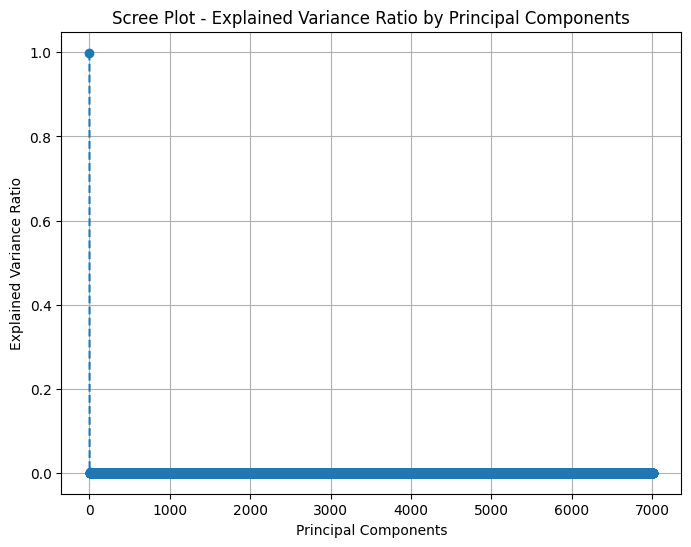

🏃 View run Custom Experiment - Voting Classifier with PCA at: https://dagshub.com/aishwarya.salvi28/heart_attack_prediction.mlflow/#/experiments/45/runs/14fcd07a0d1444adbb564220e96e79a8
🧪 View experiment at: https://dagshub.com/aishwarya.salvi28/heart_attack_prediction.mlflow/#/experiments/45
Accuracy: 0.5550
F1-Score: 0.3146


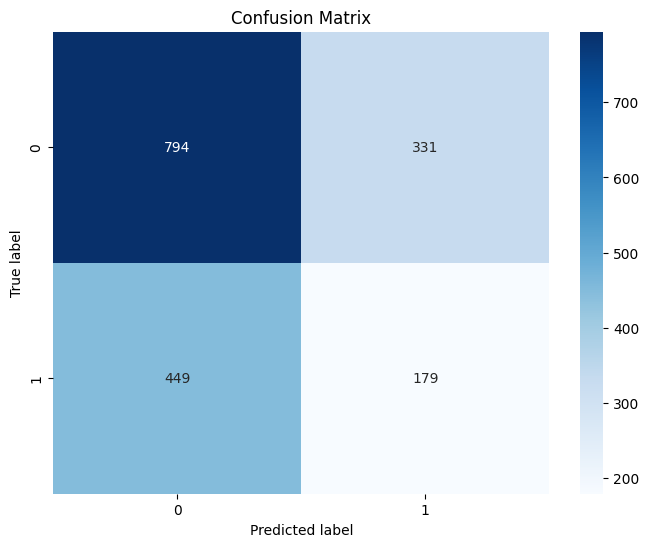

In [41]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split, StratifiedKFold, cross_val_score
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.feature_selection import SelectKBest, f_classif
from sklearn.pipeline import Pipeline
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, VotingClassifier
from sklearn.metrics import accuracy_score, f1_score, confusion_matrix
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import seaborn as sns
import mlflow
import mlflow.sklearn

# Step 1: Preprocess the Data
# Identify categorical columns
categorical_features = X.select_dtypes(include=['object']).columns.tolist()

# Encode categorical columns using OneHotEncoder
encoder = OneHotEncoder(sparse_output=False, drop='first')
encoded_features = encoder.fit_transform(X[categorical_features])

# Create a DataFrame for encoded features
encoded_df = pd.DataFrame(encoded_features, columns=encoder.get_feature_names_out(categorical_features))

# Drop original categorical columns and concatenate encoded features with numeric features
X_numeric = X.drop(columns=categorical_features).reset_index(drop=True)
X_encoded = pd.concat([X_numeric, encoded_df], axis=1)

# Step 2: Split the Data into Train and Test Sets
X_train, X_test, y_train, y_test = train_test_split(X_encoded, y, test_size=0.2, random_state=42)

# Step 3: PCA Dimensionality Reduction and Scree Plot Creation
def apply_pca_and_plot(X_train):
    pca = PCA()
    X_train_pca = pca.fit_transform(X_train)
    explained_variance_ratio = pca.explained_variance_ratio_

    # Scree plot for explained variance ratio
    plt.figure(figsize=(8, 6))
    plt.plot(range(1, len(explained_variance_ratio) + 1), explained_variance_ratio, marker='o', linestyle='--')
    plt.title("Scree Plot - Explained Variance Ratio by Principal Components")
    plt.xlabel("Principal Components")
    plt.ylabel("Explained Variance Ratio")
    plt.grid(True)
    plt.show()

    return pca

pca_model = apply_pca_and_plot(X_train)

# Step 4: Custom Experiment with Voting Classifier and Feature Selection
def custom_experiment(X_train, X_test, y_train, y_test):
    # Apply PCA with selected components (e.g., enough to explain 95% variance)
    n_components = np.argmax(np.cumsum(pca_model.explained_variance_ratio_) >= 0.95) + 1
    pca_final = PCA(n_components=n_components)
    X_train_pca = pca_final.fit_transform(X_train)
    X_test_pca = pca_final.transform(X_test)

    # Voting Classifier with RandomForest and GradientBoosting
    voting_clf = VotingClassifier(estimators=[
        ('rf', RandomForestClassifier(n_estimators=100, random_state=42)),
        ('gb', GradientBoostingClassifier(n_estimators=100, random_state=42))
    ], voting='soft')

    # Train the model on PCA-reduced data
    voting_clf.fit(X_train_pca, y_train)
    y_pred = voting_clf.predict(X_test_pca)

    # Evaluate the model
    accuracy = accuracy_score(y_test, y_pred)
    f1 = f1_score(y_test, y_pred)
    cm = confusion_matrix(y_test, y_pred)

    # Log results in MLFlow
    mlflow.log_param("PCA_n_components", n_components)
    mlflow.log_metric("accuracy", accuracy)
    mlflow.log_metric("f1_score", f1)

    # Confusion Matrix Plot
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
    plt.title('Confusion Matrix')
    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    plt.savefig("confusion_matrix.png")
    mlflow.log_artifact("confusion_matrix.png")

    return accuracy, f1

# Step 5: Run the Experiment and Log Results in MLFlow
#mlflow.set_experiment("Heart Attack Risk Prediction - Experiment 6")

with mlflow.start_run(run_name="Custom Experiment - Voting Classifier with PCA"):
    accuracy, f1_score_result = custom_experiment(X_train, X_test, y_train, y_test)

print(f"Accuracy: {accuracy:.4f}")
print(f"F1-Score: {f1_score_result:.4f}")


In [42]:
# Experiment 7
mlflow.set_experiment("Test7")

2024/12/21 04:19:40 INFO mlflow.tracking.fluent: Experiment with name 'Test7' does not exist. Creating a new experiment.


<Experiment: artifact_location='mlflow-artifacts:/077256079d7c497eab6efb3682c16619', creation_time=1734754780821, experiment_id='46', last_update_time=1734754780821, lifecycle_stage='active', name='Test7', tags={}>

Explained Variance by PCA (top 5 components): [0.00068836 0.00059389 0.00057928 0.00057117 0.00054317]
t-SNE visualization saved at: tsne_plot.png
🏃 View run t-SNE Dimensionality Reduction Experiment at: https://dagshub.com/aishwarya.salvi28/heart_attack_prediction.mlflow/#/experiments/46/runs/a1769f9635294e0287ac8348400f0f62
🧪 View experiment at: https://dagshub.com/aishwarya.salvi28/heart_attack_prediction.mlflow/#/experiments/46


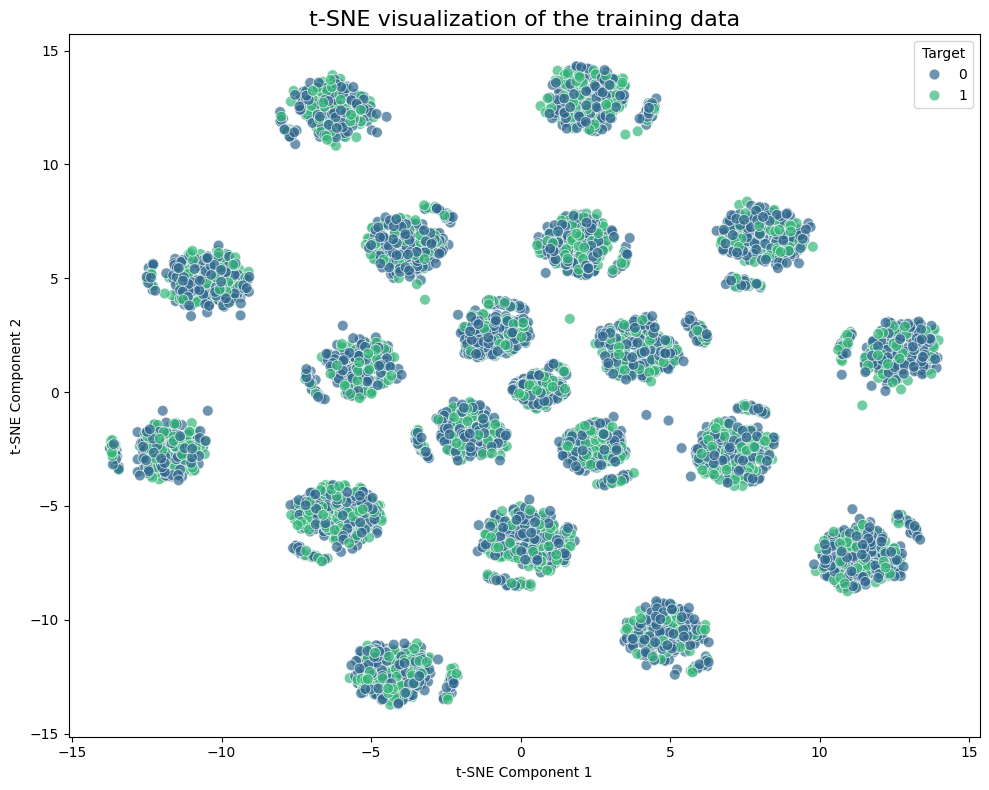

In [43]:
import mlflow
import mlflow.sklearn
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
import seaborn as sns

# Assuming X_train and y_train are your features and labels
# X_train = <Your Feature Data>
# y_train = <Your Target Labels>

# Split the data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X_train, y_train, test_size=0.2, random_state=42, stratify=y_train)

# Standardizing the features (important for t-SNE)
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)

# Initialize and fit t-SNE with the scaled features
tsne = TSNE(n_components=2, random_state=42)
X_tsne = tsne.fit_transform(X_train_scaled)

# Visualize the t-SNE results
plt.figure(figsize=(10, 8))
sns.scatterplot(x=X_tsne[:, 0], y=X_tsne[:, 1], hue=y_train, palette="viridis", s=60, alpha=0.7)
plt.title("t-SNE visualization of the training data", fontsize=16)
plt.xlabel("t-SNE Component 1")
plt.ylabel("t-SNE Component 2")
plt.legend(title="Target", loc="best")
plt.tight_layout()

# Log the t-SNE visualization in MLFlow
with mlflow.start_run(run_name="t-SNE Dimensionality Reduction Experiment"):
    # Log the t-SNE plot as an artifact in MLFlow
    plot_path = "tsne_plot.png"
    plt.savefig(plot_path)
    mlflow.log_artifact(plot_path)

    # Log the explained variance (before applying t-SNE, PCA could be used for dimensionality reduction if needed)
    pca = PCA(n_components=5)
    X_pca = pca.fit_transform(X_train_scaled)
    explained_variance = pca.explained_variance_ratio_

    # Log PCA explained variance ratio
    mlflow.log_metric("PCA_Explained_Variance_Ratio", explained_variance.sum())

    # Optionally log the PCA components and t-SNE components for reference
    mlflow.log_param("PCA_Components", str(pca.components_))
    mlflow.log_param("t-SNE_Components", str(X_tsne[:5]))  # Log the first 5 rows of t-SNE components

    # Output evaluation results
    print(f"Explained Variance by PCA (top 5 components): {explained_variance}")
    print(f"t-SNE visualization saved at: {plot_path}")


🏃 View run LogisticRegression at: https://dagshub.com/aishwarya.salvi28/heart_attack_prediction.mlflow/#/experiments/46/runs/1da2508089e44aceb643f8ebc70f9a42
🧪 View experiment at: https://dagshub.com/aishwarya.salvi28/heart_attack_prediction.mlflow/#/experiments/46
🏃 View run RandomForestClassifier at: https://dagshub.com/aishwarya.salvi28/heart_attack_prediction.mlflow/#/experiments/46/runs/4084fd3d9938411fb1f38860ed9f7f6b
🧪 View experiment at: https://dagshub.com/aishwarya.salvi28/heart_attack_prediction.mlflow/#/experiments/46
🏃 View run RidgeClassifier at: https://dagshub.com/aishwarya.salvi28/heart_attack_prediction.mlflow/#/experiments/46/runs/046d22effc8e4b488a503307076736a9
🧪 View experiment at: https://dagshub.com/aishwarya.salvi28/heart_attack_prediction.mlflow/#/experiments/46


<ipython-input-44-c40a6f6884d5>:82: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='F1_Score', y='Experiment', data=df_results, palette='Blues_d')


🏃 View run F1-Score Comparison Plot at: https://dagshub.com/aishwarya.salvi28/heart_attack_prediction.mlflow/#/experiments/46/runs/fb2181c20d854950a2aeaf8ca02cff96
🧪 View experiment at: https://dagshub.com/aishwarya.salvi28/heart_attack_prediction.mlflow/#/experiments/46


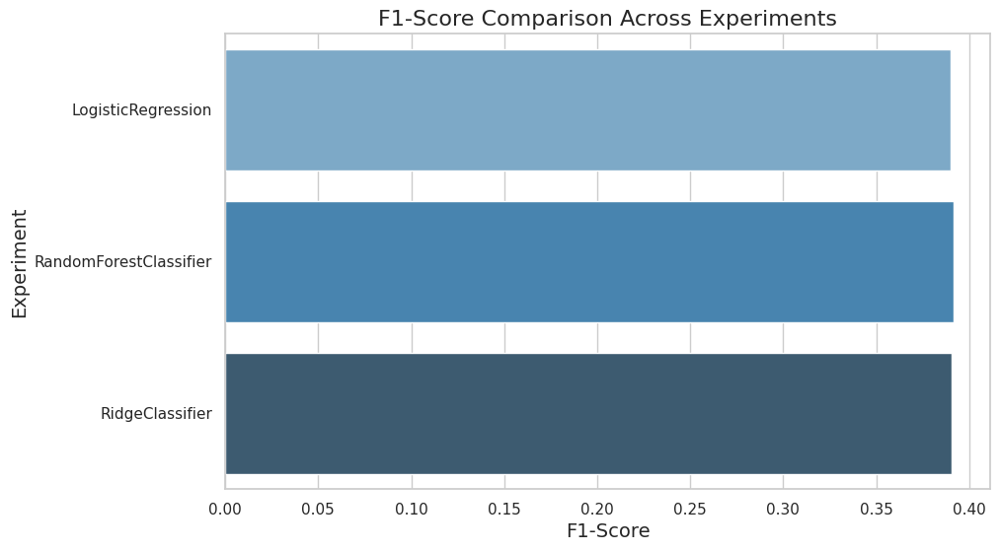

In [44]:
import os
import mlflow
import mlflow.sklearn
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import RidgeClassifier
from sklearn.metrics import f1_score
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OneHotEncoder, StandardScaler
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
import pandas as pd

# Assuming X and y are your features and labels

# Identify numeric and categorical columns in X
numeric_features = X.select_dtypes(include=['int64', 'float64']).columns.tolist()
categorical_features = X.select_dtypes(include=['object']).columns.tolist()

# Define preprocessing pipeline
preprocessor = ColumnTransformer(
    transformers=[
        ('num', StandardScaler(), numeric_features),
        ('cat', OneHotEncoder(handle_unknown='ignore'), categorical_features)
    ]
)

# Split the data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

# Define a function to run the models and log the results
def run_model(model, X_train, y_train, X_test, y_test):
    # Create a pipeline with preprocessing and the model
    pipeline = Pipeline(steps=[
        ('preprocessor', preprocessor),
        ('classifier', model)
    ])

    # Train the model
    pipeline.fit(X_train, y_train)

    # Predict on the test data
    y_pred = pipeline.predict(X_test)

    # Calculate F1 score
    f1 = f1_score(y_test, y_pred, average='macro')

    # Return the F1 score for logging and plotting
    return f1

# List of models (instantiating the models here)
models = [
    ('LogisticRegression', LogisticRegression(max_iter=1000)),
    ('RandomForestClassifier', RandomForestClassifier(random_state=42)),
    ('RidgeClassifier', RidgeClassifier())
]

experiment_results = []

# Start an MLFlow run for each experiment
for experiment_name, model in models:
    with mlflow.start_run(run_name=experiment_name):
        # Run the model and get the F1 score
        f1 = run_model(model, X_train, y_train, X_test, y_test)

        # Log the F1 score to MLFlow
        mlflow.log_metric("F1_Score", f1)

        # Store the result for plotting
        experiment_results.append({'Experiment': experiment_name, 'F1_Score': f1})

# Create a DataFrame with the results for plotting after all runs are complete
df_results = pd.DataFrame(experiment_results)

# Set the style of the plot using seaborn
sns.set(style="whitegrid")

# Create a bar plot for F1-scores
plt.figure(figsize=(10, 6))
sns.barplot(x='F1_Score', y='Experiment', data=df_results, palette='Blues_d')

# Add labels and title
plt.title('F1-Score Comparison Across Experiments', fontsize=16)
plt.xlabel('F1-Score', fontsize=14)
plt.ylabel('Experiment', fontsize=14)

# Save the plot to a file
plot_filename = 'f1_score_comparison.png'
plt.savefig(plot_filename)

# Log the plot as an artifact in MLFlow (optional)
with mlflow.start_run(run_name="F1-Score Comparison Plot"):
    mlflow.log_artifact(plot_filename)

# Display the plot
plt.show()

# Remove the plot file after logging to avoid clutter (optional)
os.remove(plot_filename)


In [45]:
import joblib
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import OneHotEncoder, StandardScaler
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.metrics import classification_report, confusion_matrix

# Assuming X and y are your features and target variables

# Identify numeric and categorical columns
numeric_features = X.select_dtypes(include=['int64', 'float64']).columns.tolist()
categorical_features = X.select_dtypes(include=['object']).columns.tolist()

# Define preprocessing pipeline
preprocessor = ColumnTransformer(
    transformers=[
        ('num', StandardScaler(), numeric_features),
        ('cat', OneHotEncoder(handle_unknown='ignore'), categorical_features)
    ]
)

# Define a full pipeline with preprocessing and model
pipeline = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('classifier', RandomForestClassifier(random_state=42))
])

# Split the data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Train the pipeline
pipeline.fit(X_train, y_train)

# Make predictions on the test set
y_pred = pipeline.predict(X_test)

# Print evaluation metrics
print("Classification Report:")
print(classification_report(y_test, y_pred))
print("Confusion Matrix:")
print(confusion_matrix(y_test, y_pred))

# Save the entire pipeline (preprocessing + model)
joblib.dump(pipeline, 'random_forest_pipeline.joblib')


Classification Report:
              precision    recall  f1-score   support

           0       0.64      1.00      0.78      1125
           1       0.40      0.00      0.01       628

    accuracy                           0.64      1753
   macro avg       0.52      0.50      0.39      1753
weighted avg       0.56      0.64      0.50      1753

Confusion Matrix:
[[1122    3]
 [ 626    2]]


['random_forest_pipeline.joblib']